In [1]:
%pip install -r requirements.txt

Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 310.7/310.7 KB 623.2 kB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.6/4.6 MB 328.2 kB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.3/114.3 KB 548.2 kB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 808.2/808.2 KB 340.3 kB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.9/105.9 KB 272.0 kB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 371.4 kB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/18.2 MB 427.2 kB/s eta 0:00:0000:0100:02
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.8/63.8 KB 532.6 kB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 385.5/385.5 KB 379.6 kB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 940.9 kB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━

In [208]:
# ruff :noqa: E402

import os

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as ex
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split



# Background

# Dataset

In [209]:
sns.set_style("whitegrid")
%matplotlib inline


SEED : int = 31415
def set_seed(seed: int = SEED) -> None:
    np.random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)


set_seed()

In [210]:
df = pd.read_csv("data/AB_US_2023.csv")

/tmp/ipykernel_162828/3866743118.py:1: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("data/AB_US_2023.csv")


Here we are reading the first rows of the dataset.

In [211]:
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,city
0,958,"Bright, Modern Garden Unit - 1BR/1BTH",1169,Holly,NaN,Western Addition,37.77028,-122.43317,Entire home/apt,202,2,383,2023-02-19,2.31,1,128,59,San Francisco
1,5858,Creative Sanctuary,8904,Philip And Tania,NaN,Bernal Heights,37.74474,-122.42089,Entire home/apt,235,30,111,2017-08-06,0.66,1,365,0,San Francisco
2,8142,Friendly Room Apt. Style -UCSF/USF - San Franc...,21994,Aaron,NaN,Haight Ashbury,37.76555,-122.45213,Private room,56,32,9,2022-10-27,0.09,13,365,1,San Francisco
3,8339,Historic Alamo Square Victorian,24215,Rosy,NaN,Western Addition,37.77564,-122.43642,Entire home/apt,575,9,28,2019-06-28,0.17,2,365,0,San Francisco
4,8739,"Mission Sunshine, with Private Bath",7149,Ivan & Wendy,NaN,Mission,37.76030,-122.42197,Private room,110,1,770,2023-02-25,4.65,2,159,34,San Francisco


In [212]:
print(df.shape)
#print numercal data 
numerical_columns = df.select_dtypes(include=np.number).columns.tolist()
print(numerical_columns)
print(len(numerical_columns))
# print categorical data
categorical_columns = df.select_dtypes(exclude=np.number).columns.tolist()
print(categorical_columns)
print(len(categorical_columns))


(232147, 18)
['id', 'host_id', 'latitude', 'longitude', 'price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 'calculated_host_listings_count', 'availability_365', 'number_of_reviews_ltm']
11
['name', 'host_name', 'neighbourhood_group', 'neighbourhood', 'room_type', 'last_review', 'city']
7


The size of the data set is 232147 rows and 18 columns with 11numerical columns and 7 categorical columns.

In [213]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 232147 entries, 0 to 232146
Data columns (total 18 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   id                              232147 non-null  int64  
 1   name                            232131 non-null  object 
 2   host_id                         232147 non-null  int64  
 3   host_name                       232134 non-null  object 
 4   neighbourhood_group             96500 non-null   object 
 5   neighbourhood                   232147 non-null  object 
 6   latitude                        232147 non-null  float64
 7   longitude                       232147 non-null  float64
 8   room_type                       232147 non-null  object 
 9   price                           232147 non-null  int64  
 10  minimum_nights                  232147 non-null  int64  
 11  number_of_reviews               232147 non-null  int64  
 12  last_review     

In [214]:
df.describe(include="all")

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,city
count,2.321470e+05,232131,2.321470e+05,232134,96500,232147,232147.000000,232147.000000,232147,232147.000000,232147.000000,232147.000000,183062,183062.000000,232147.000000,232147.000000,232147.000000,232147
unique,NaN,220164,NaN,29368,30,1412,NaN,NaN,4,NaN,NaN,NaN,3147,NaN,NaN,NaN,NaN,27
top,NaN,Presidential Suite In A Mansion,NaN,Blueground,City of Los Angeles,Unincorporated Areas,NaN,NaN,Entire home/apt,NaN,NaN,NaN,2023-03-05,NaN,NaN,NaN,NaN,New York City
freq,NaN,150,NaN,4305,22204,11882,NaN,NaN,169142,NaN,NaN,NaN,5008,NaN,NaN,NaN,NaN,42931
mean,2.584580e+17,NaN,1.582248e+08,NaN,NaN,NaN,36.610585,-98.301436,NaN,259.468001,13.495867,40.915230,NaN,1.638348,29.879055,180.985686,11.689701,NaN
std,3.465985e+17,NaN,1.587164e+08,NaN,NaN,NaN,5.126523,19.706929,NaN,1024.645918,27.920631,80.649152,NaN,1.910812,106.013665,134.715299,20.599954,NaN
min,6.000000e+00,NaN,2.300000e+01,NaN,NaN,NaN,25.957323,-123.089130,NaN,0.000000,1.000000,0.000000,NaN,0.010000,1.000000,0.000000,0.000000,NaN
25%,2.638896e+07,NaN,2.299242e+07,NaN,NaN,NaN,33.976225,-118.315111,NaN,91.000000,2.000000,1.000000,NaN,0.310000,1.000000,52.000000,0.000000,NaN
50%,4.896307e+07,NaN,1.005783e+08,NaN,NaN,NaN,36.190556,-97.727670,NaN,149.000000,3.000000,9.000000,NaN,1.000000,2.000000,175.000000,3.000000,NaN
75%,6.633014e+17,NaN,2.686930e+08,NaN,NaN,NaN,40.717440,-77.026222,NaN,250.000000,30.000000,43.000000,NaN,2.420000,10.000000,321.000000,16.000000,NaN


### Visualization
- Firstly we did some steps to prepare our dataset for visualization

1) dropped all rows with price negative or null

In [7]:
df_vis = df.drop(columns=["name", "id", "host_name", "host_id"])
# drop rows with missing price or price == 0
df_vis = df_vis.dropna(subset=["price"])
df_vis = df_vis[df_vis["price"] > 0]


2) Visualize the missing values in our dataset and we found that the columns with significant number of missing values are:
    - last reviews
    - reviews per month
    - neighbourhood_group


<Axes: >

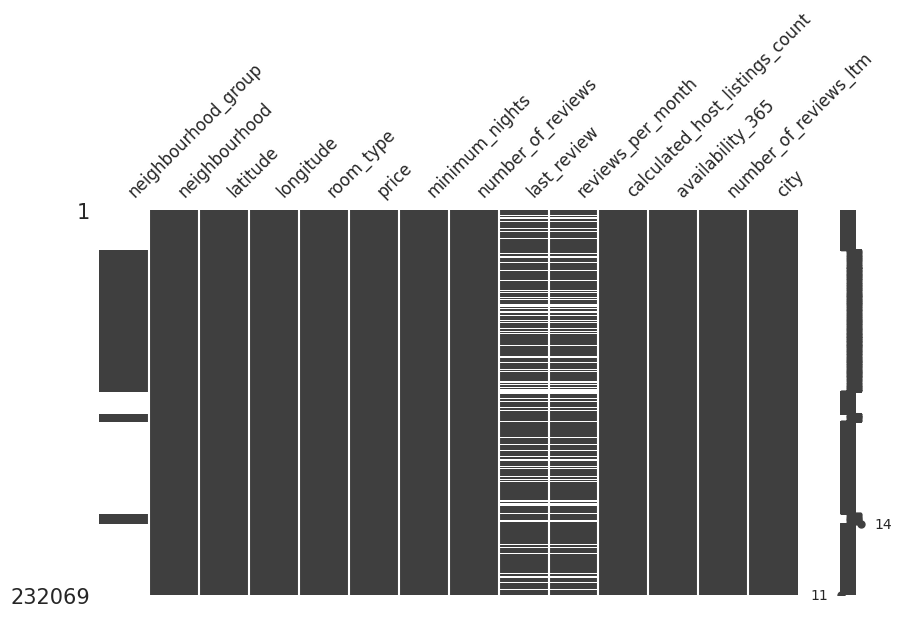

In [8]:
import missingno as msno

msno.matrix(df_vis, figsize=(10, 5), fontsize=12)

3) Scatter plot between all pairs of numeric values 

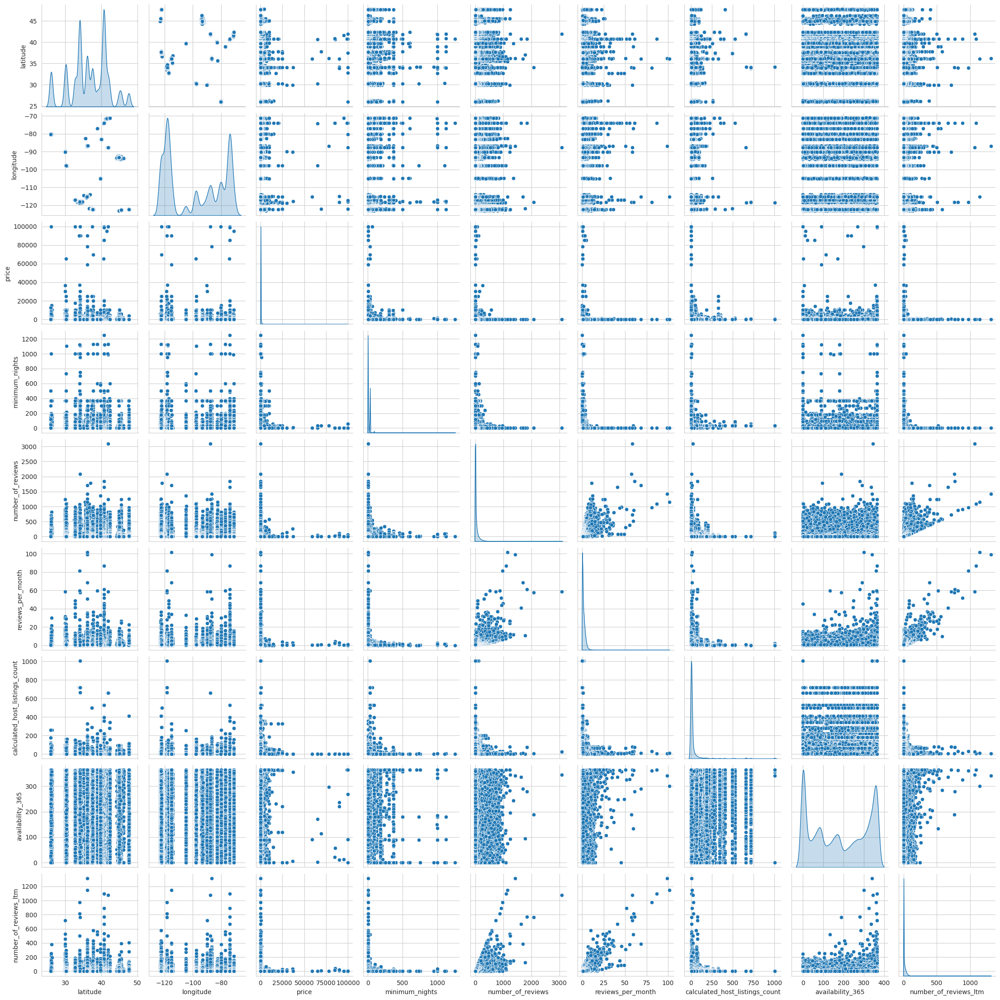

In [9]:
# plot scatter plot between all pairs of numerical columns
numerical_columns = ['latitude', 'longitude', 'price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 'calculated_host_listings_count', 'availability_365', 'number_of_reviews_ltm']
sns.pairplot(df_vis[numerical_columns], diag_kind="kde")


4) Distribution of price using histogram and violin plot


<Axes: xlabel='price', ylabel='Count'>

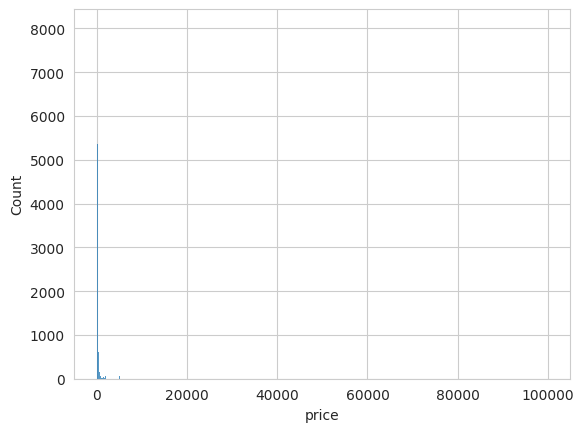

In [10]:
sns.histplot(df_vis["price"], legend=True, label="price", cbar=True)

<Axes: xlabel='price'>

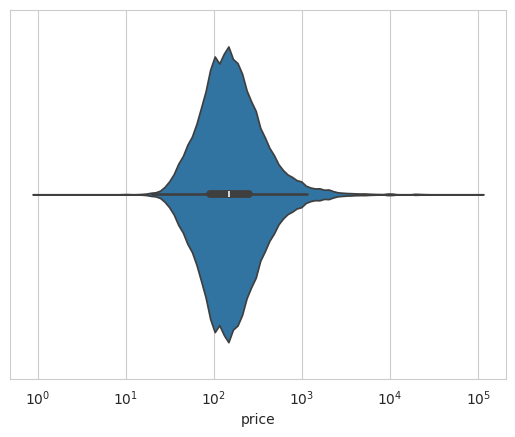

In [11]:
#plot violin for price showing the median , inter quartile range 
sns.violinplot(x="price", data=df_vis, log_scale=True)


we found that there is an outlier that makes the histogram of price large in the scale of X axis so we diceded to plot on a small range 

<Axes: xlabel='price', ylabel='Count'>

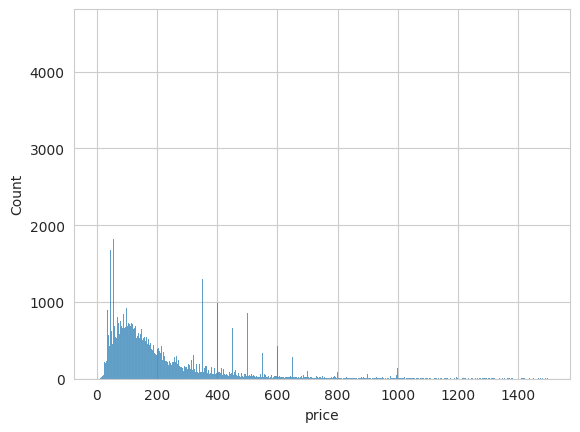

In [12]:
#plot histogram for price from range 0 to 1500 
sns.histplot(df_vis["price"], legend=True, label="price", cbar=True, bins=range(0, 1500))

5) Numerical columns distribution using violin plot

<Axes: xlabel='latitude', ylabel='Count'>

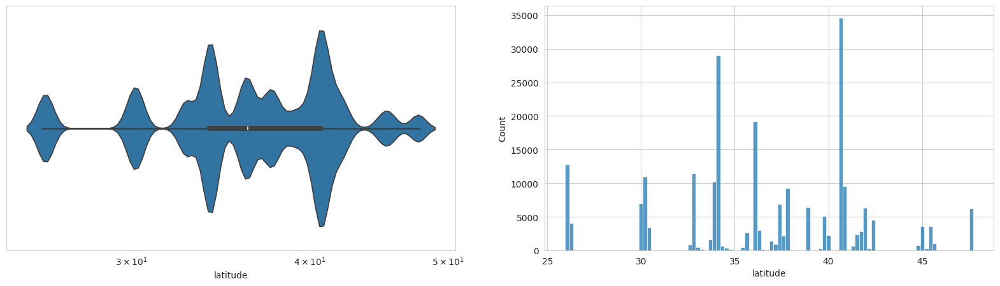

In [15]:
numerical_columns = ['latitude', 'longitude', 'price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 'calculated_host_listings_count', 'availability_365', 'number_of_reviews_ltm']

fig, ax = plt.subplots(1, 2, figsize=(20, 5))

sns.violinplot(x="latitude", data=df_vis, log_scale=True, ax=ax[0])
sns.histplot(df_vis["latitude"], legend=True, label="latitude", cbar=True, ax=ax[1])


<Axes: xlabel='longitude', ylabel='Count'>

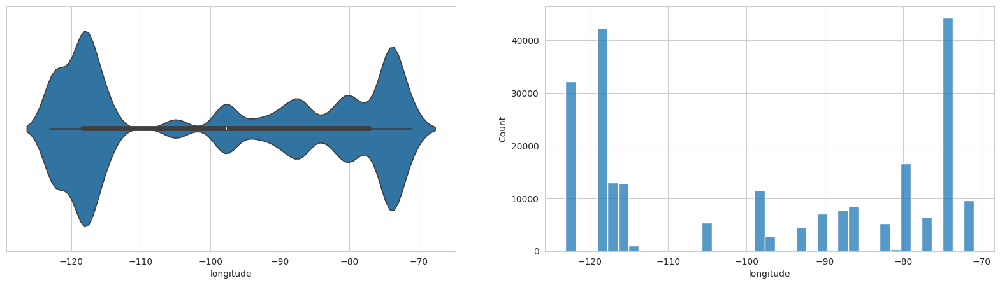

In [14]:
fig, ax = plt.subplots(1, 2, figsize=(20, 5))

sns.violinplot(x="longitude", data=df_vis, ax=ax[0])
sns.histplot(df_vis["longitude"], legend=True, label="longitude", cbar=True, ax=ax[1])

0


<Axes: xlabel='number_of_reviews', ylabel='Count'>

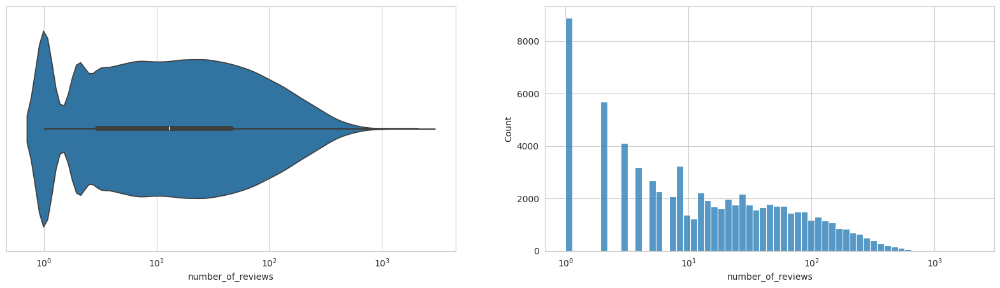

In [15]:
fig, ax = plt.subplots(1, 2, figsize=(20, 5))

df_vis1 = df_vis.dropna()
#print number of nan values in number_of_reviews column
print(df_vis1["number_of_reviews"].isna().sum())
sns.violinplot(x="number_of_reviews", data=df_vis1, log_scale=True, ax=ax[0])
sns.histplot(df_vis1["number_of_reviews"], legend=True, label="number_of_reviews", cbar=True, ax=ax[1], log_scale=True)

<Axes: xlabel='availability_365', ylabel='Count'>

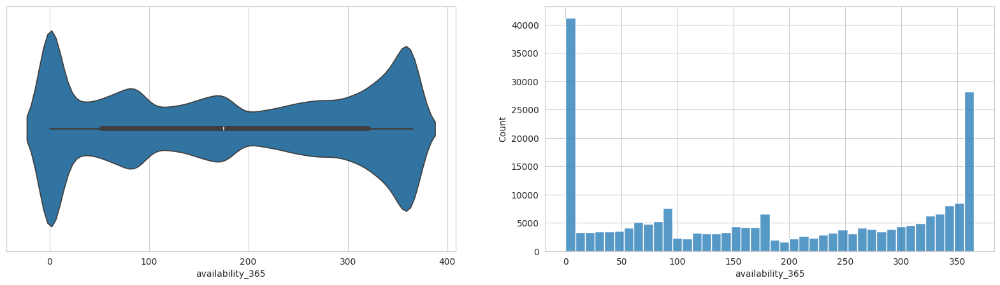

In [16]:
#plot violin and histogram for availability_365 beside eachother 
# drop nan values and infs
fig, ax = plt.subplots(1, 2, figsize=(20, 5))

sns.violinplot(x="availability_365", data=df_vis, ax=ax[0])
sns.histplot(df_vis["availability_365"], legend=True, label="availability_365", cbar=True, ax=ax[1])


1250


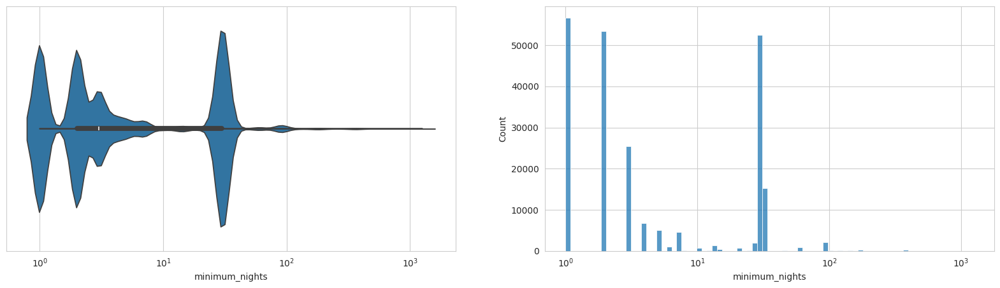

In [17]:
fig, ax = plt.subplots(1, 2, figsize=(20, 5))

sns.violinplot(x="minimum_nights", data=df_vis, ax=ax[0], log_scale=True)
sns.histplot(df_vis["minimum_nights"], legend=True, label="minimum_nights", cbar=True, ax=ax[1],log_scale=True)

# print maximum value
print(df_vis["minimum_nights"].max())

it seems that minmum_nights column as well as price has some outliers that should be removed 

6) correlation between numerical columns

<Axes: >

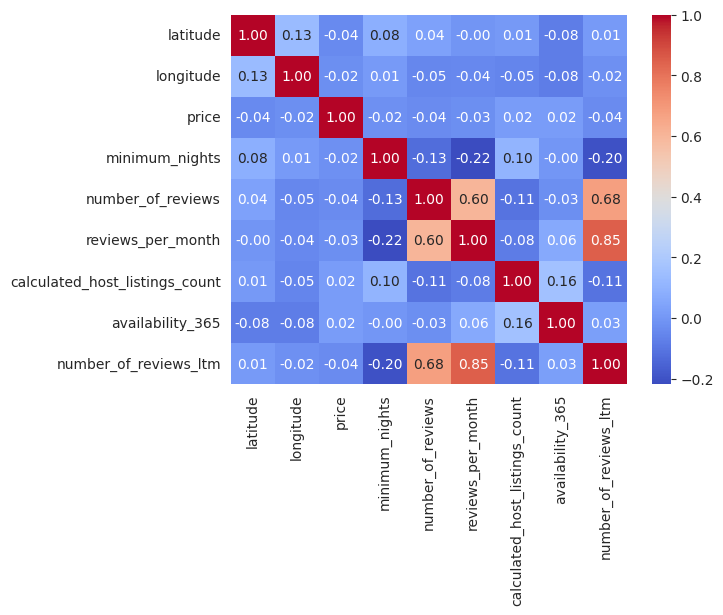

In [16]:
numerical_columns = ['latitude', 'longitude', 'price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 'calculated_host_listings_count', 'availability_365', 'number_of_reviews_ltm']
# plot heatmap for numerical columns
sns.heatmap(df_vis[numerical_columns].corr(), annot=True, fmt=".2f", cmap="coolwarm")

7) Analysis of categorical columns

        Room Type

<Axes: xlabel='room_type', ylabel='price'>

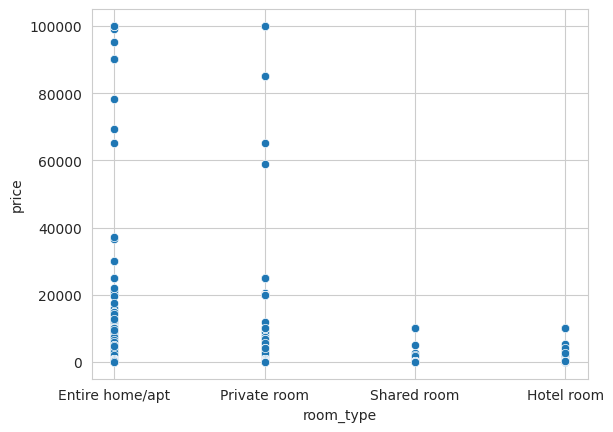

In [17]:
#plot price against room type
sns.scatterplot(x="room_type", y="price", data=df_vis)

In [18]:
info = df_vis.groupby("room_type").agg({"price": ["mean", "median", "std", "min", "max"]})
print(info)

                      price                                
                       mean median          std min     max
room_type                                                  
Entire home/apt  282.002188  177.0   870.604812   1  100000
Hotel room       803.423292  254.0  1259.686964  22   10000
Private room     193.999615   75.0  1374.945356   5  100000
Shared room       99.217047   42.0   456.720061  11   10000


Since there is alot of outliers in the price we can compare between median of the 4 categories and we could found that Hotel room tends to be more expensive than other categories

     City
 

/tmp/ipykernel_2713/3806700428.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(y=df_vis['city'],order=df_vis['city'].value_counts().index,palette='rocket')


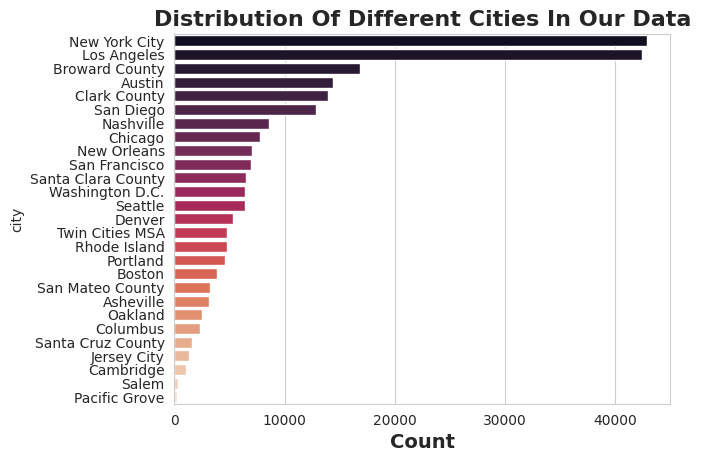

In [19]:
#Distribution of different cities 
ax = sns.countplot(y=df_vis['city'],order=df_vis['city'].value_counts().index,palette='rocket')
ax.set_title('Distribution Of Different Cities In Our Data',fontsize=16,fontweight='bold')
ax.set_xlabel('Count',fontsize=14,fontweight='bold')
#ax.set_title()
plt.show()

In [20]:
states_dic = {'Asheville':'NC','Austin':'TX','Boston':'MA','Broward County':'FL','Cambridge':'MA','Chicago':'IL','Clark County':'NV','Columbus':'OH','Denver':'CO','Hawaii':'HI','Jersey City':'NJ',
             'Los Angeles':'SC','Nashville':'TN','New Orleans':'MS','New York City':'NY','Oakland':'CA','Pacific Grove':'CA','Portland':'OR','Rhode Island':'RI','Salem':'MA','San Clara Country':'CA',
             'Santa Cruz County':'CA','San Diego':'CA','San Francisco':'CA','San Mateo County':'CA','Seattle':'WA','Twin Cities MSA':'MN','Washington D.C.':'DC', 'Santa Clara County':'CA'}

df_vis['state'] = df_vis['city'].apply(lambda x : states_dic[x])


In [21]:
## group by state and price mean
g_dat = df_vis.groupby(by='state').agg('price').mean()

#g_dat = g_dat.reset_index()
fig = ex.choropleth(g_dat,locations=g_dat.index,color='price', locationmode="USA-states", scope="usa",title='Average Listing Price At Each State', color_continuous_scale=ex.colors.diverging.Portland)
fig.show()

# Objective/Goal


# Methodology

## Data Cleaning/Preprocessing

### Handling Missing Values 
The folllowing are the missing values analysis: 

<Axes: >

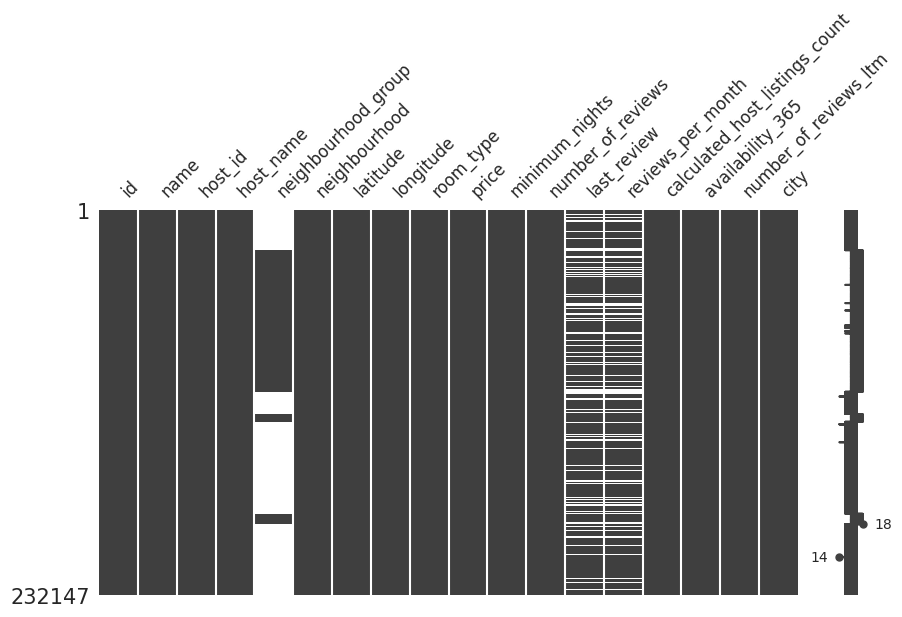

In [215]:
import missingno as msno

msno.matrix(df, figsize=(10, 5), fontsize=12)

In [216]:
missing_values = df.isna().sum()
missing_values = missing_values[missing_values > 0]
missing_values = missing_values / df.shape[0]
missing_values


name                   0.000069
host_name              0.000056
neighbourhood_group    0.584315
last_review            0.211439
reviews_per_month      0.211439
dtype: float64

In [217]:
# Completely remove columns with more than 50% missing values
df = df.drop(columns=missing_values[missing_values > 0.5].index)
print ("New shape: ", df.shape)

New shape:  (232147, 17)


In [218]:
# get number of reviews for rows with missing reviews_per_month and last_review
df[df["reviews_per_month"].isnull()]["number_of_reviews"].value_counts()

number_of_reviews
0    49085
Name: count, dtype: int64

We can see that the reason why reviews_per_month or last_review is null is because the host has never received a review. Therefore, we can replace the null values with 0 or the mode in the case of last_review.

In [219]:
df["reviews_per_month"].fillna(0, inplace=True)

There is no proper way to handle missing values of `last_review` since it's a datetime component. The number of rows that has this feature missing is around 20% of the data. Thus, it's more logical to sacrifice the feature.

In [220]:
# drop feature last_review
df = df.drop(columns=["last_review"])
print("New shape: ", df.shape)

New shape:  (232147, 16)


<Axes: >

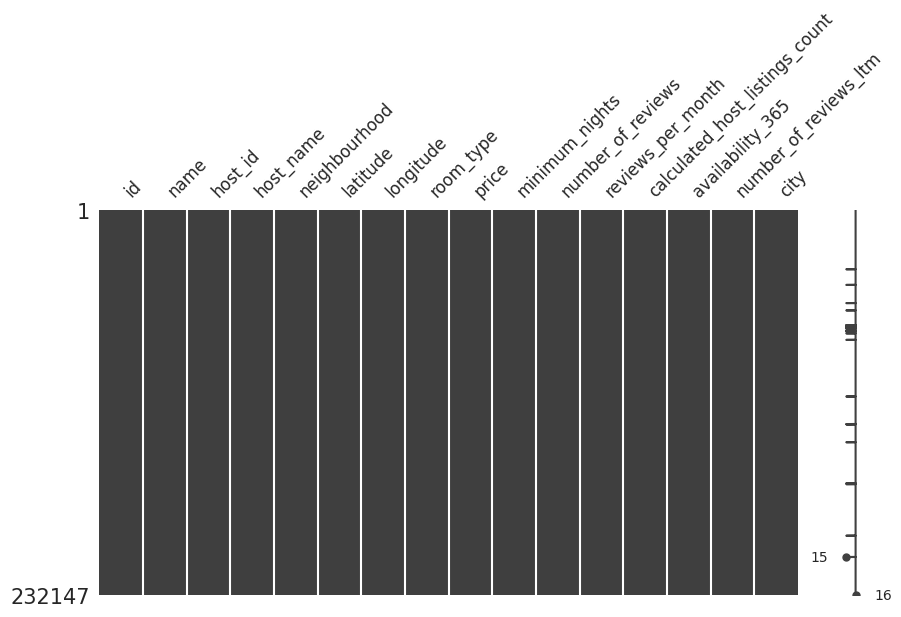

In [221]:
import missingno as msno

msno.matrix(df, figsize=(10, 5), fontsize=12)

### Remove duplicate rows

In [222]:
# remove duplicates
cnt = df.duplicated(subset=df.columns.difference(["id"])).sum()
df = df.drop_duplicates(subset=df.columns.difference(["id"]))
print(f"Removed {cnt} duplicates.")

Removed 403 duplicates.


In [223]:
# Remove zeros from price and print their count
cnt = df[df["price"] == 0].shape[0]
df = df[df["price"] > 0]
print(f"Removed {cnt} rows with price = 0.")

Removed 78 rows with price = 0.


### Outlier Removal

From the visulizations done above, we can see that there's outliers in the following columns: 
1. price
2. minimum_nights
3. number_of_reviews

#### Price

<Axes: xlabel='price'>

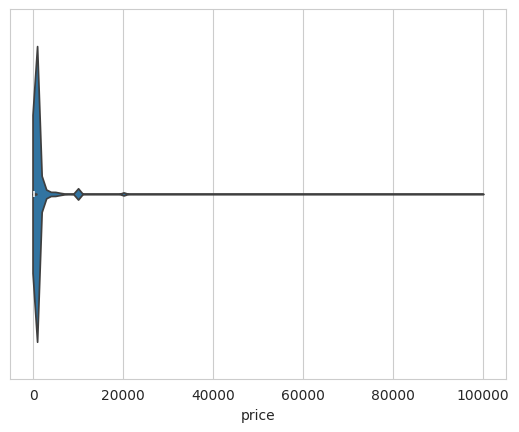

In [165]:
# remove outliers for price
# boxplot
sns.violinplot(x="price", data=df)

In [166]:
df.shape

(231666, 16)

In [224]:
# Remove outliers from price using IQR on log
# calculate IQR
q25, q75 = np.percentile(np.log(df["price"]), 25), np.percentile(np.log(df["price"]), 75)
iqr = q75 - q25
print("Percentiles: 25th=%.3f, 75th=%.3f, IQR=%.3f" % (q25, q75, iqr))

# calculate the outlier cutoff
cut_off = iqr * 1.5
lower, upper = q25 - cut_off, q75 + cut_off
print("Cut Off: %.3f" % cut_off)

# identify outliers
outliers = [x for x in np.log(df["price"]) if x < lower or x > upper]
print("Identified outliers: %d" % len(outliers))

# remove outliers
df = df[(np.log(df["price"]) > lower) & (np.log(df["price"]) < upper)]

df.shape

Percentiles: 25th=4.511, 75th=5.521, IQR=1.011
Cut Off: 1.516
Identified outliers: 5055


(226611, 16)

<Axes: xlabel='price'>

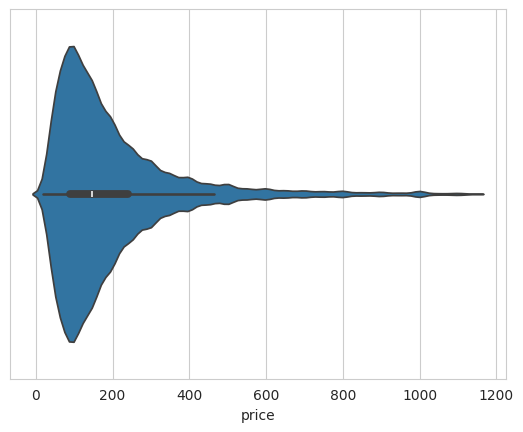

In [168]:
# boxplot
sns.violinplot(x=df["price"])

#### Number of Reviews


<Axes: xlabel='number_of_reviews'>

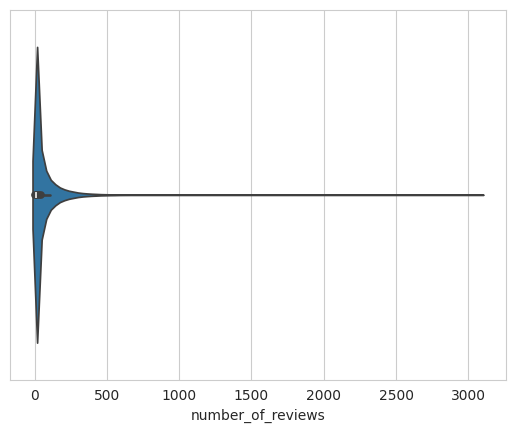

In [169]:
# violinplot
sns.violinplot(x=df["number_of_reviews"])

IQR removal will remove alot of rows and we think that number of reviews is important feature and the outliers are not wrong values so we will only the extreme ones.

In [225]:
# Count and remove all rows with number_of_reviews > 500
print("Number of rows removed with number_of_reviews > 500: ", df[df["number_of_reviews"] > 500].shape[0])
df = df[df["number_of_reviews"] <= 500]

Number of rows removed with number_of_reviews > 500:  1017


<Axes: xlabel='number_of_reviews'>

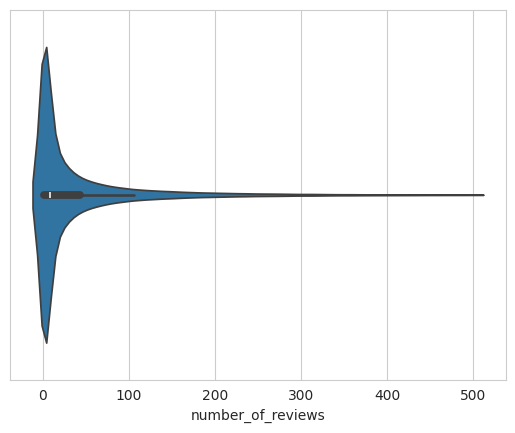

In [171]:
# violinplot
sns.violinplot(x=df["number_of_reviews"])


#### Minimum Nights

<Axes: xlabel='minimum_nights'>

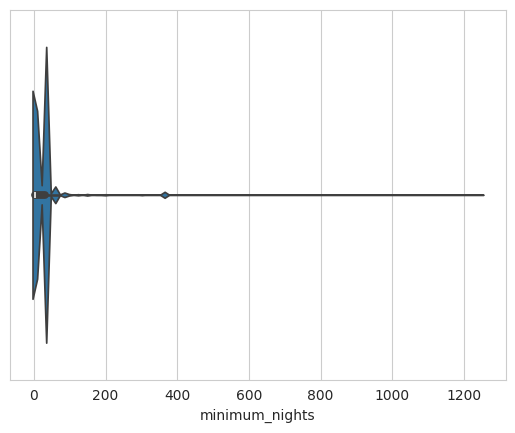

In [172]:
sns.violinplot(x=df["minimum_nights"])

In [226]:
# use interquartile range to remove outliers
q1 = df["minimum_nights"].quantile(0.25)
q3 = df["minimum_nights"].quantile(0.75)
iqr = q3 - q1
lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr
print("Bounds for removing outliers of minimum_nights: ", lower_bound, upper_bound)

# print number of outliers
print("Number of outliers: ", df[(df["minimum_nights"] < lower_bound) | (df["minimum_nights"] > upper_bound)].shape[0])

# remove outliers
df = df[(df["minimum_nights"] > lower_bound) & (df["minimum_nights"] < upper_bound)]


Bounds for removing outliers of minimum_nights:  -40.0 72.0
Number of outliers:  3588


<Axes: xlabel='minimum_nights'>

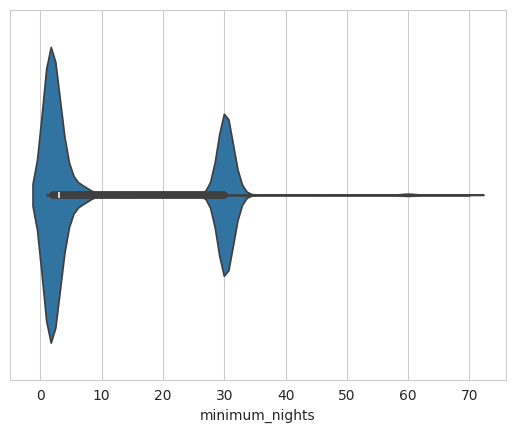

In [174]:
# violinplot
sns.violinplot(x=df["minimum_nights"])

## Feature Extraction and Selection

### Remove Unnecessary Columns
- host_name: An alomst unqiue column showing the name of the host. Unrelated to the regression as there is another column called `calculated_host_listings_count` that shows how many listings this host has done.
- host_id: A unique numbering for the host done by the original database and unrelated to the prediction.
- id: A unique numbering done by the original database and unrelated to the prediction.
- name: A description for the listings. Analyzing it would require more deep learning methods.

In [227]:
## remove unnecessary columns
unnecessary_columns = [
    "host_name",
    "host_id",
    "id",
    "name"
]

df = df.drop(columns=unnecessary_columns)
print("New shape: ", df.shape)

New shape:  (222006, 12)


### Correlation Analysis

<Axes: >

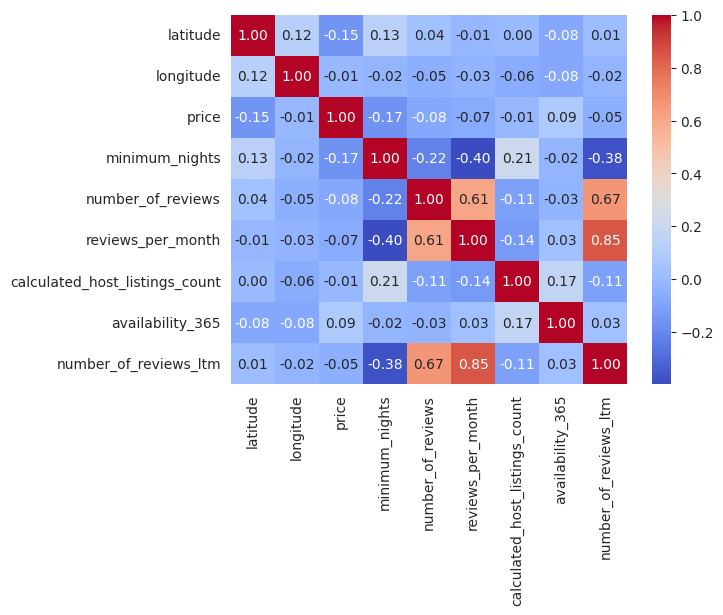

In [228]:
## get numerical columns 
numerical_columns = df.select_dtypes(include=np.number).columns.tolist()
## corr between numerical columns except price
corr = df[numerical_columns].corr()
## plot heatmap
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm")


we can see that reviews per month and  reviews ltm is highly correlated with number of reviews so we will drop them

In [229]:
## drop reviews ltm
df = df.drop(columns=["number_of_reviews_ltm"])
## drop number of reviews
df = df.drop(columns=["number_of_reviews"])

print("New shape: ", df.shape)

New shape:  (222006, 11)


<Axes: >

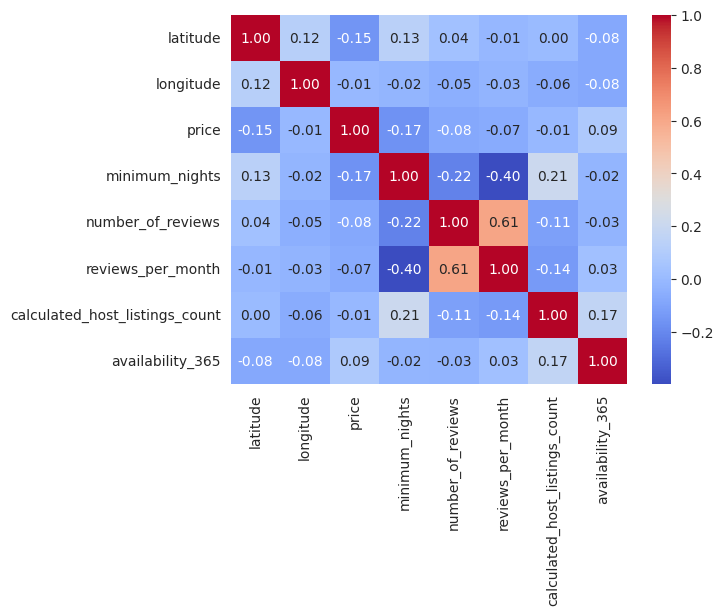

In [230]:
## get numerical columns 
numerical_columns = df.select_dtypes(include=np.number).columns.tolist()
## corr between numerical columns except price
corr = df[numerical_columns].corr()
## plot heatmap
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm")

### Encoding

We decided to drop neighbourhood column because it has a lot of classes and will result to a lot of columns after one hot encoding. which will be computationally heavy and we still have city, longtitude and latitude so we will not lose a lot of information.

In [231]:
# Drop neighbourhood column
df = df.drop(columns=["neighbourhood"])
df = df.drop(columns=["city"])

In [232]:
# Print categorical columns
categorical_columns = df.select_dtypes(exclude=np.number).columns.tolist()
print(categorical_columns)

['room_type']


In [233]:
# Do one-hot encoding for categorical columns
## drop city column
df = pd.get_dummies(df, columns=categorical_columns)
print("New shape: ", df.shape)

New shape:  (222006, 12)


In [234]:
df.describe()

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,222006.000000,222006.000000,222006.000000,222006.000000,222006.000000,222006.000000,222006.000000,222006.000000
mean,36.615629,-98.311188,197.749921,11.378796,39.390345,1.299592,28.961397,180.290416
std,5.137053,19.683100,168.379250,13.390738,69.994305,1.690973,106.161551,134.350862
min,25.957323,-123.089130,20.000000,1.000000,0.000000,0.000000,1.000000,0.000000
25%,33.973823,-118.312910,90.000000,2.000000,1.000000,0.060000,1.000000,52.000000
50%,36.195590,-97.725300,148.000000,3.000000,9.000000,0.630000,2.000000,174.000000
75%,40.717047,-77.029595,243.000000,30.000000,44.000000,2.000000,10.000000,320.000000
max,47.734010,-70.996000,1138.000000,70.000000,500.000000,55.460000,1003.000000,365.000000


### PCA Analysis

[0.47658298 0.1884822  0.15967983]
0.8247450012705748


<BarContainer object of 3 artists>

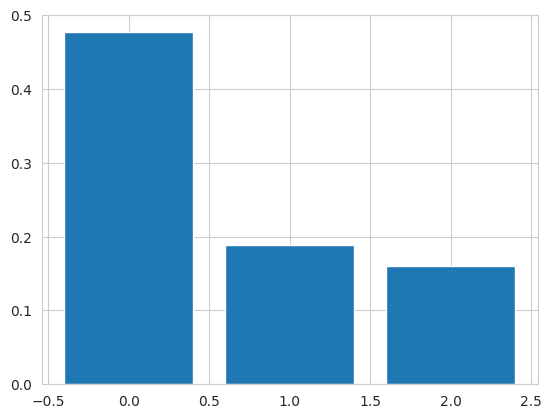

In [235]:
## create pca with explained variance bar graph and data projected on the chosen PCA
from sklearn.preprocessing import MinMaxScaler

pca = PCA(n_components=3)

X = df.drop(columns=["price"])
y = df["price"]
## normalize X with min max scaler
scaler = MinMaxScaler()
X = scaler.fit_transform(X)


pca.fit(X)
print(pca.explained_variance_ratio_)
print (pca.explained_variance_ratio_.sum())
 #plot bar graph
plt.bar(range(3),pca.explained_variance_ratio_)

with 3 components we reached an explained variance of around 0.82

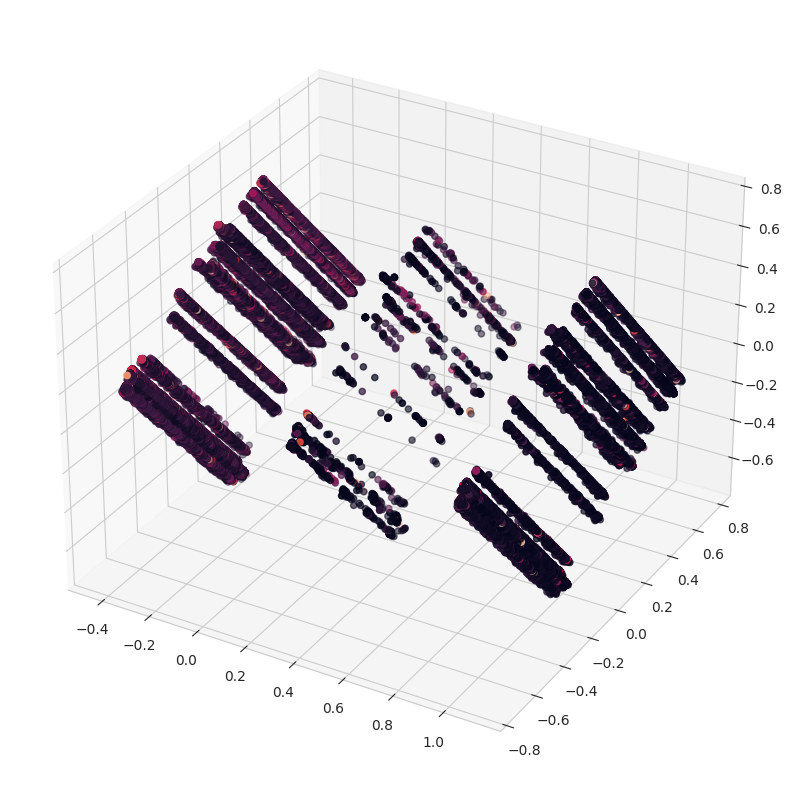

In [236]:
## plot data 3d projected on the chosen pca
X_pca = pca.transform(X)
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X_pca[:,0],X_pca[:,1],X_pca[:,2],c=y)
plt.show()

### Cross Validation Prep

In [237]:
X, y = df.drop(columns=["price"]), df["price"]
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=SEED
)

### Model Training

In [239]:
from sklearn.metrics import mean_squared_error as mse
from sklearn.metrics import r2_score
from sklearn import metrics

def print_evaluation(true, pred):
    print('MSE: ', mse(true, pred))
    print('R2: ', r2_score(true, pred))
    print('RMSE: ', np.sqrt(mse(true, pred)))
    print('MAE: ', metrics.mean_absolute_error(true, pred))

def plot_actual_vs_predicted(true, pred):
    plt.figure(figsize=(10, 5))
    sns.kdeplot(true, label='Actual')
    sns.kdeplot(pred, label='Predicted')
    plt.legend()
    plt.show()

def plot_residuals(true, pred):
    ## create data frame of true and predicted values

    plt.figure(figsize=(10, 5))
    plt.title('Residuals')
    sns.residplot(x=true, y=pred)
    plt.show()

## function to plot regression boundary along original points
def plot_regression_boundary(true_values, predicted_values):
    # Calculate residuals
    residuals = true_values - predicted_values
    
    # Create a scatter plot of true values and predicted values
    plt.figure(figsize=(10, 6))
    plt.scatter(predicted_values, true_values, c='blue', label='Original Points')

    # Plot the regression line
    sns.regplot(x=predicted_values, y=true_values, scatter=False, color='red', label='Regression Line')

   

    # Set plot labels and title
    plt.xlabel('Predicted Values')
    plt.ylabel('True Values')
    plt.title('Regression Boundary with Residuals')

    # Show the legend
    plt.legend()

    # Show the plot
    plt.show()

#### Random Forest

MSE:  22666.08433614826
R2:  0.19688980279415857
RMSE:  150.55259657723695
MAE:  96.74066224114544


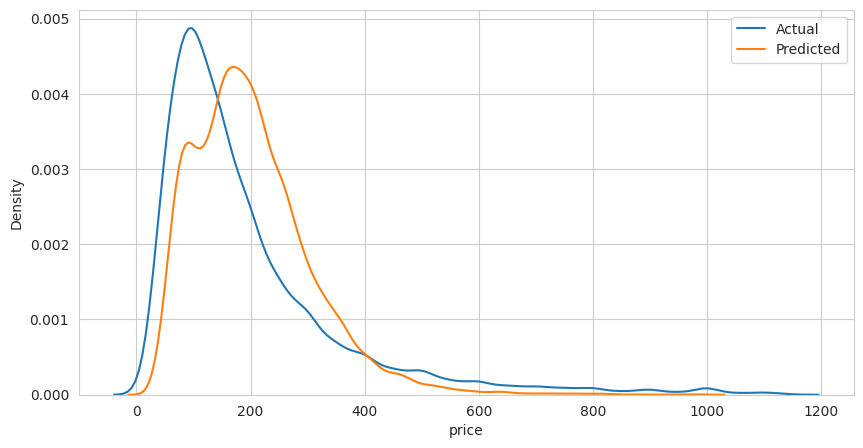

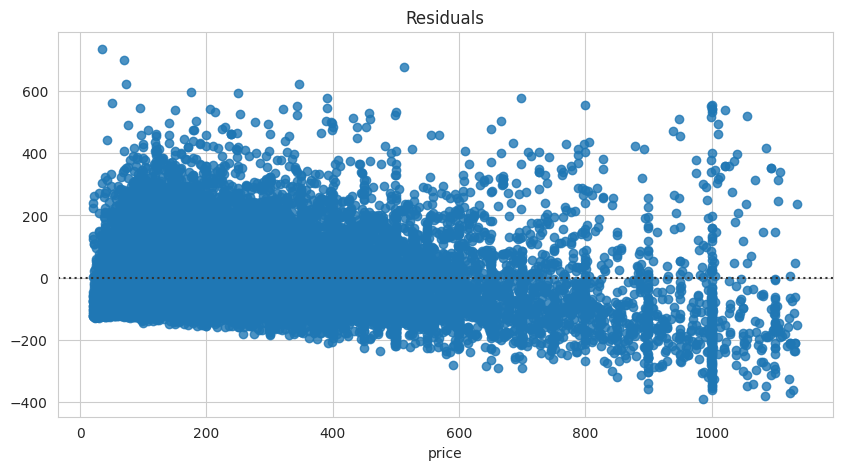

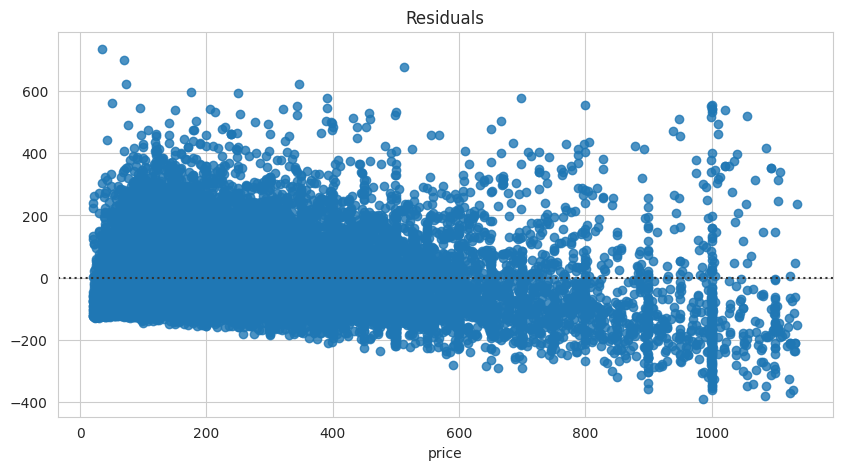

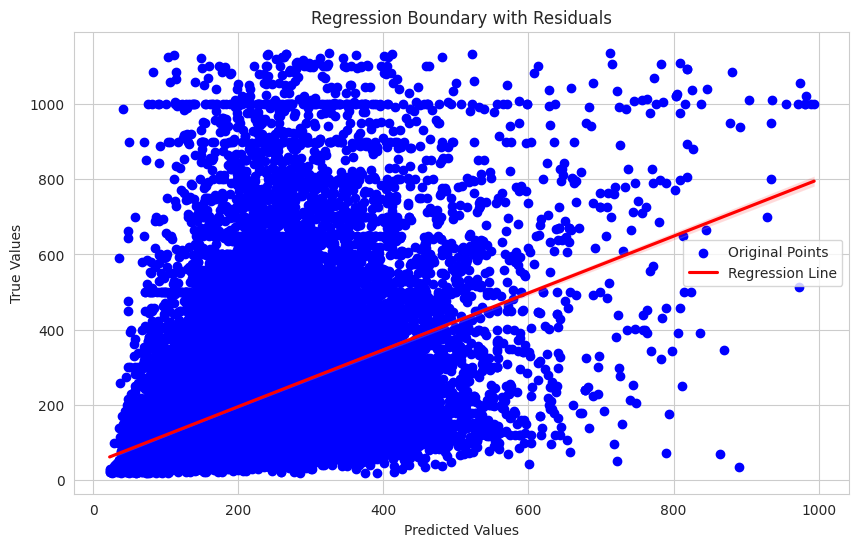

In [240]:
# Random Forst With PCA
from sklearn.ensemble import RandomForestRegressor 

pipeline = Pipeline(
    [
        ("scalerr", MinMaxScaler()),
        ("pca", PCA(n_components=3)),
        ("rf", RandomForestRegressor(
            n_jobs=-1))
    ]
)

pipeline.fit(X_train, y_train)

# evaluate on test data
y_pred = pipeline.predict(X_test)
print_evaluation(y_test, y_pred)
plot_actual_vs_predicted(y_test, y_pred)
plot_residuals(y_test, y_pred)
plot_regression_boundary(y_test.values, y_pred)
#plot_regression_boundary(X_train.values, y_train.values, pipeline)

MSE:  16713.103861288248
R2:  0.4078172507037513
RMSE:  129.27917025293846
MAE:  79.6840083235867


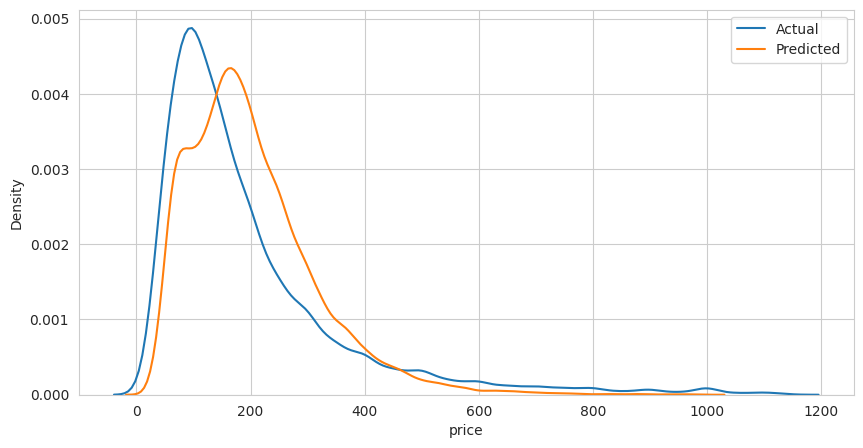

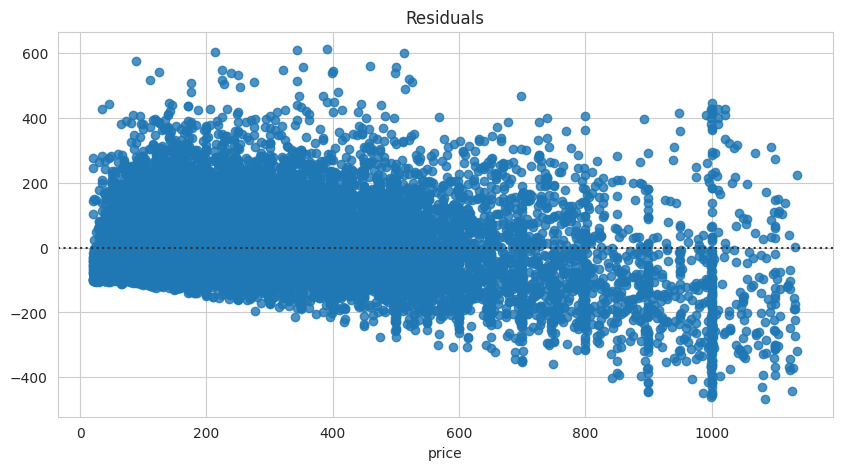

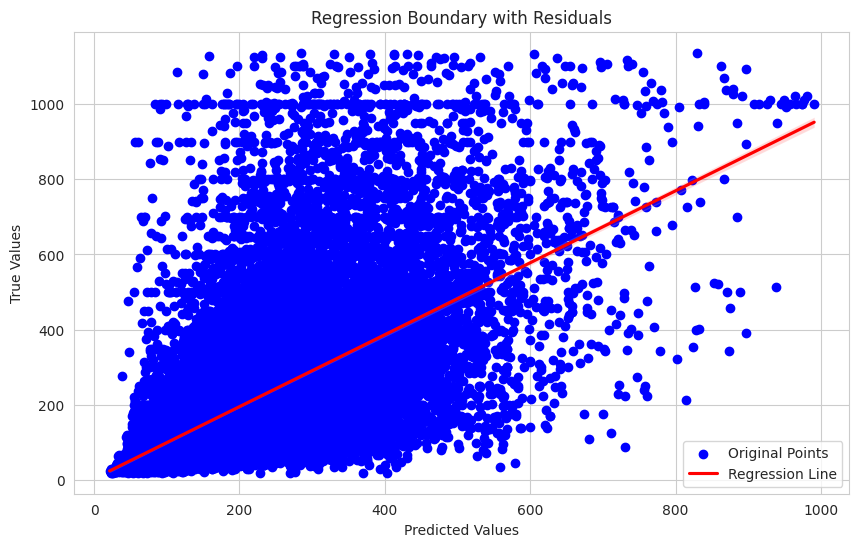

In [242]:
# Random Forst Without PCA
from sklearn.ensemble import RandomForestRegressor 

pipeline = Pipeline(
    [
        ("scaler", MinMaxScaler()),
        ("rf", RandomForestRegressor(
            n_jobs=-1))
    ]
)

pipeline.fit(X_train, y_train)

# evaluate on test data
y_pred = pipeline.predict(X_test)
## scale y test and ypred using min max scaler


print_evaluation(y_test, y_pred)
plot_actual_vs_predicted(y_test, y_pred)
plot_residuals(y_test, y_pred)
plot_regression_boundary(y_test.values, y_pred)

Random Forest performs better without PCA and that is because it is in general a good model with high dinemsionality data.

#### K Nearest Neighbour

MSE:  24272.54052700329
R2:  0.13996945743999634
RMSE:  155.79647148444437
MAE:  100.21543173730912


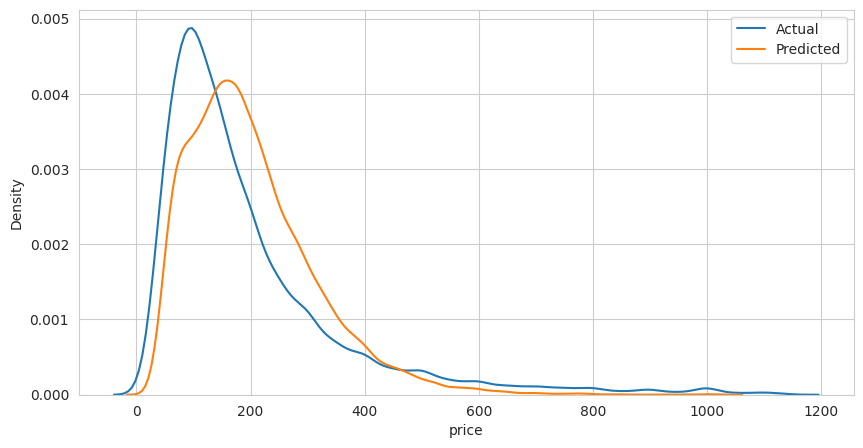

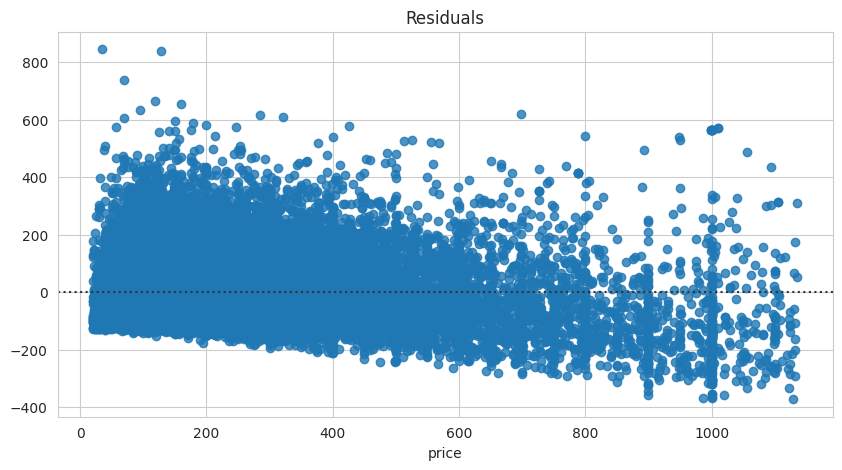

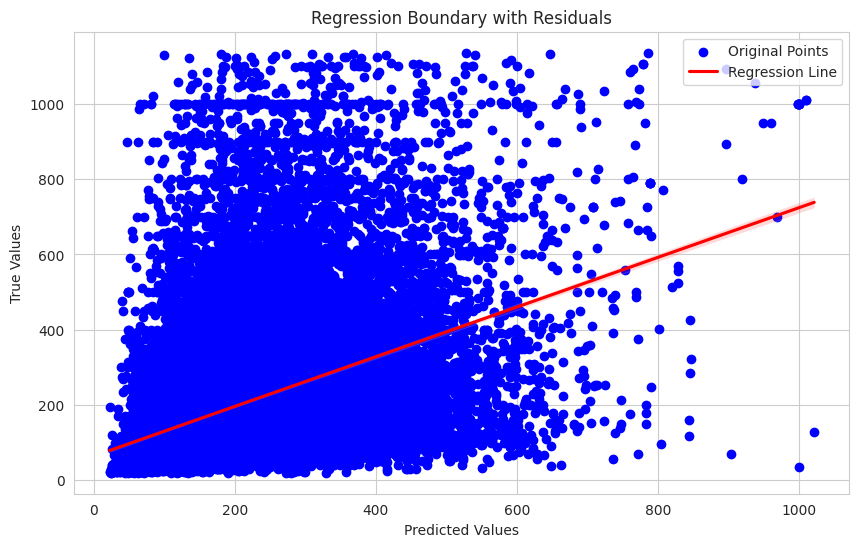

In [243]:
# Using KNN with PCA 
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import RandomizedSearchCV

pipeline = Pipeline(
    [
        ("scaler", MinMaxScaler()),
        ("pca", PCA(n_components=3)),
        ("knn", KNeighborsRegressor())
    ]
)



pipeline.fit(X_train, y_train)


# evaluate on test data
y_pred = pipeline.predict(X_test)
print_evaluation(y_test, y_pred)
plot_actual_vs_predicted(y_test, y_pred)
plot_residuals(y_test, y_pred)
plot_regression_boundary(y_test.values, y_pred)

MSE:  21956.563816044323
R2:  0.222029705936295
RMSE:  148.17747405069477
MAE:  92.83896220890952


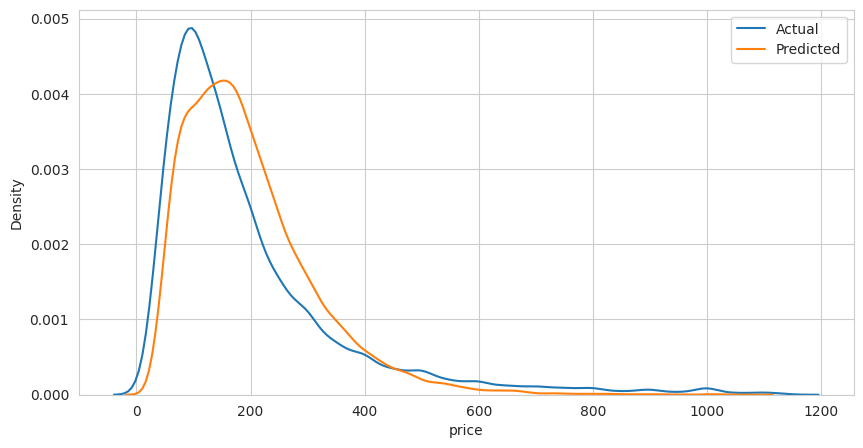

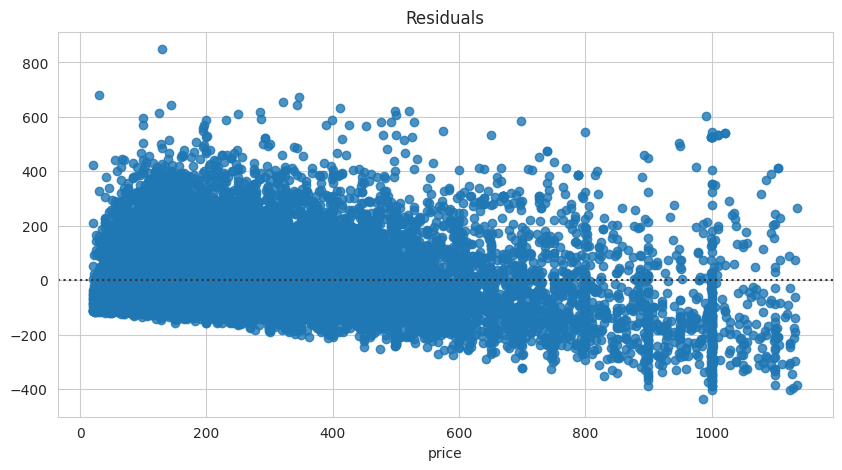

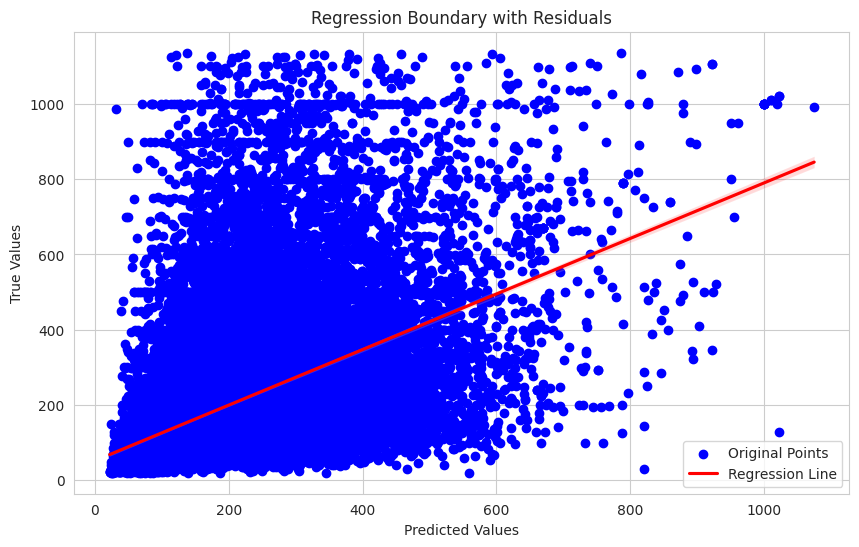

In [244]:
# Using KNN without PCA
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import RandomizedSearchCV

pipeline = Pipeline(
    [
        ("scaler", MinMaxScaler()),
        ("knn", KNeighborsRegressor())
    ]
)



pipeline.fit(X_train, y_train)


# evaluate on test data
y_pred = pipeline.predict(X_test)
print_evaluation(y_test, y_pred)
plot_actual_vs_predicted(y_test, y_pred)
plot_residuals(y_test, y_pred)
plot_regression_boundary(y_test.values, y_pred)

#### LGBMRRegressor

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029882 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1461
[LightGBM] [Info] Number of data points in the train set: 177604, number of used features: 11
[LightGBM] [Info] Start training from score 197.805956
MSE:  18293.604882519325
R2:  0.3518165552143854
RMSE:  135.25385348491673
MAE:  85.7119525242274


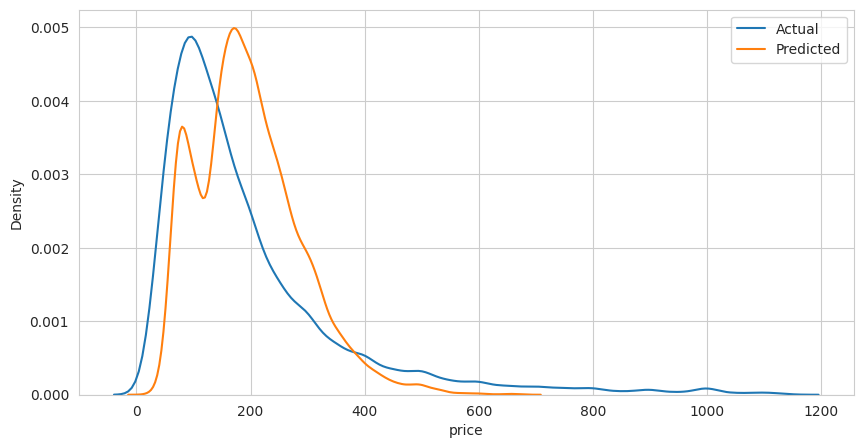

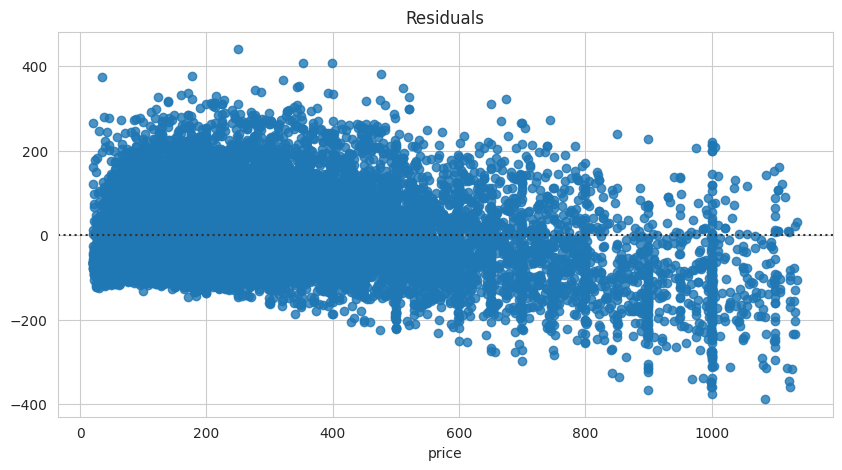

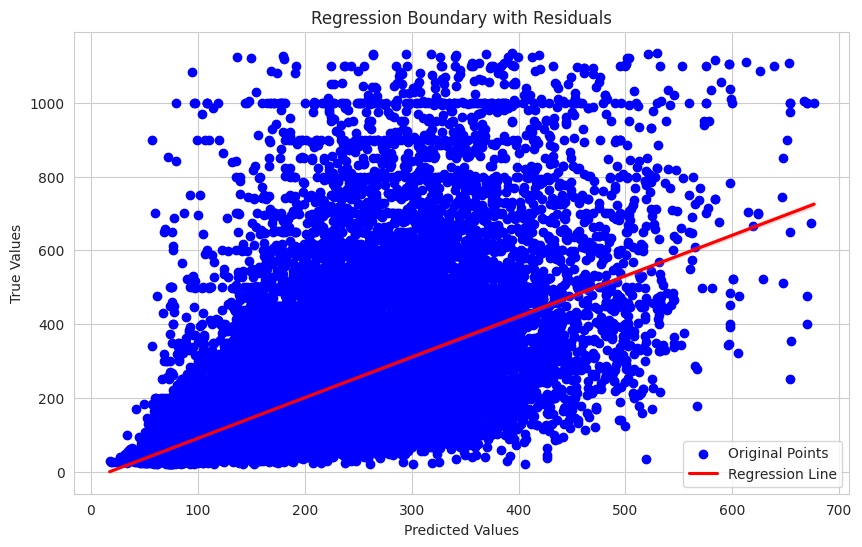

In [245]:
#Without PCA
from lightgbm import LGBMRegressor
from sklearn.model_selection import RandomizedSearchCV

pipeline = Pipeline(
    [
        ("scaler", MinMaxScaler()),
        ("lgbm", LGBMRegressor())
    ]
)
pipeline.fit(X_train, y_train)

# evaluate on test data
y_pred = pipeline.predict(X_test)
print_evaluation(y_test, y_pred)
plot_actual_vs_predicted(y_test, y_pred)
plot_residuals(y_test, y_pred)
plot_regression_boundary(y_test.values, y_pred)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004510 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 177604, number of used features: 3
[LightGBM] [Info] Start training from score 197.805956
MSE:  23167.803964823906
R2:  0.17911275123324422
RMSE:  152.20973676090472
MAE:  99.89128440730464


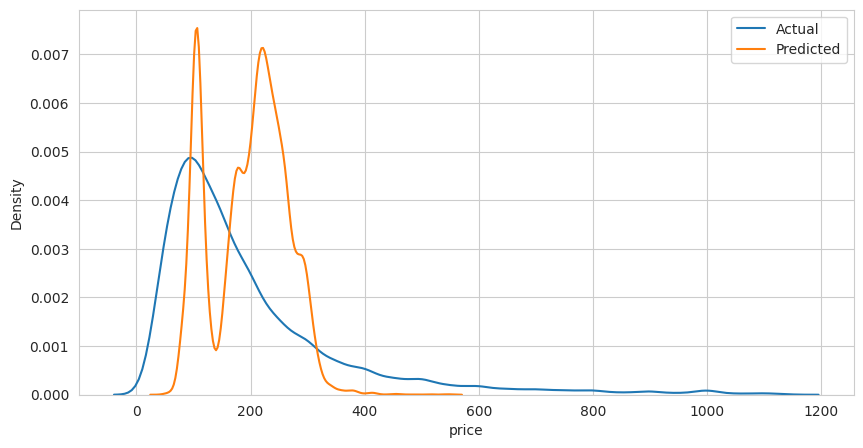

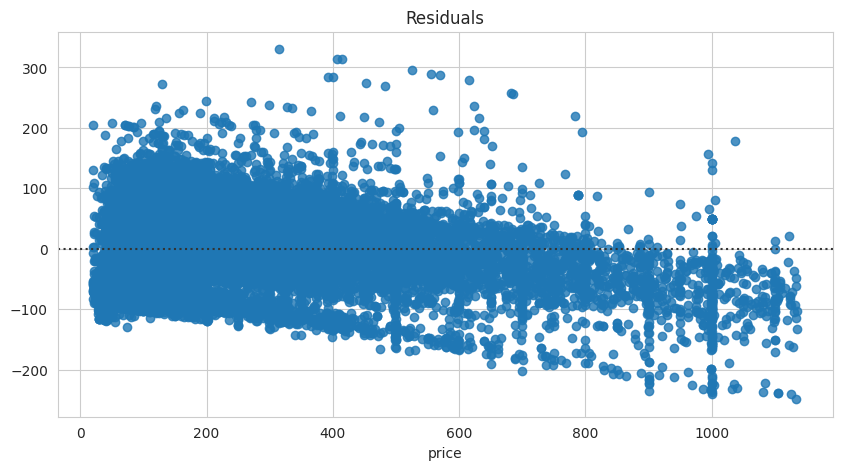

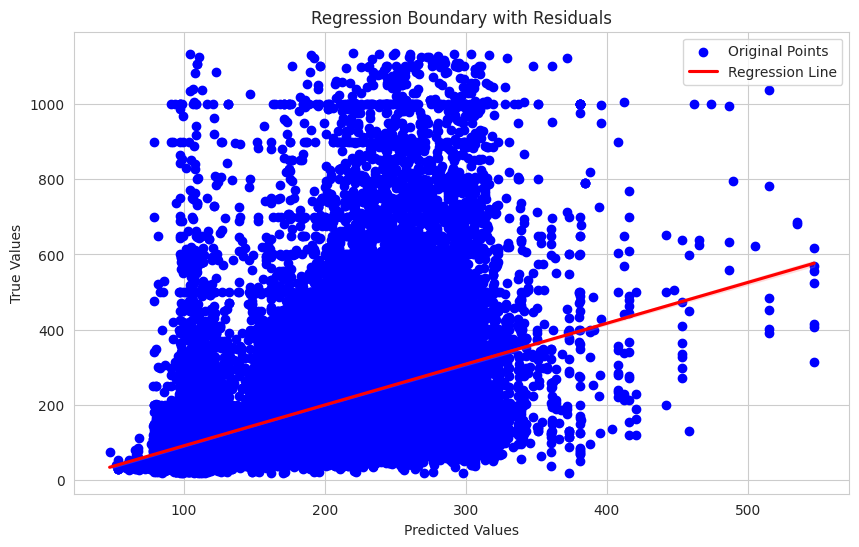

In [246]:
from lightgbm import LGBMRegressor
from sklearn.model_selection import RandomizedSearchCV

pipeline = Pipeline(
    [
        ("scaler", MinMaxScaler()),
        ("pca", PCA(n_components=3)),
        ("lgbm", LGBMRegressor())
    ]
)
pipeline.fit(X_train, y_train)

# evaluate on test data
y_pred = pipeline.predict(X_test)
print_evaluation(y_test, y_pred)
plot_actual_vs_predicted(y_test, y_pred)
plot_residuals(y_test, y_pred)
plot_regression_boundary(y_test.values, y_pred)

PCA make the model perform worse and that is because LGBMRRegressor is a good model with high dinemsionality data.

MSE:  22636.390134782214
R2:  0.1979419349384357
RMSE:  150.45394689001088
MAE:  98.13626814998972


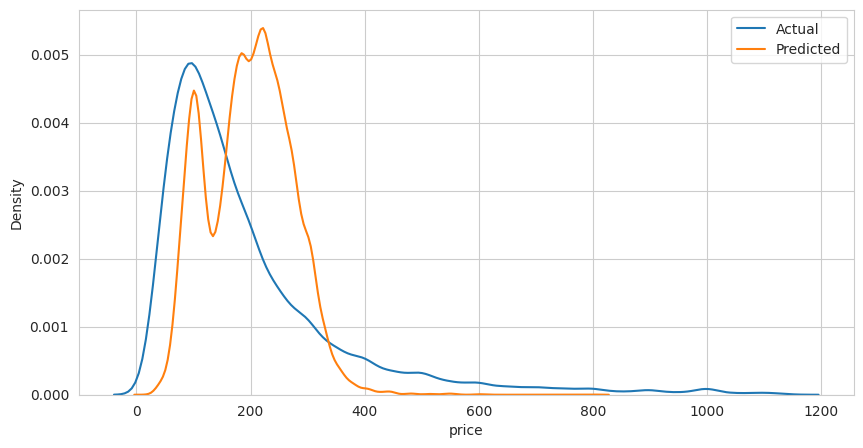

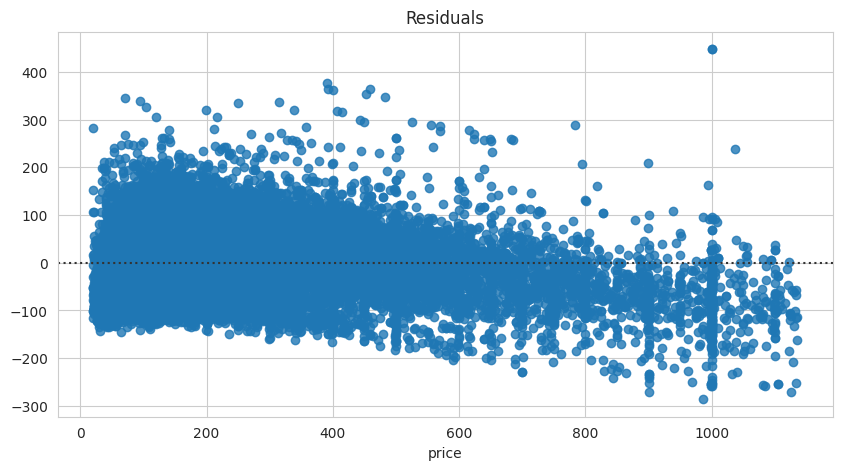

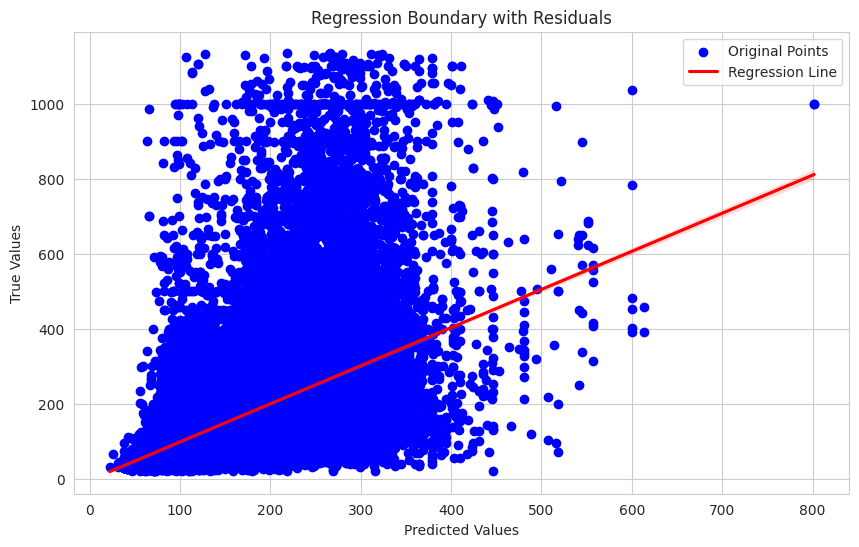

In [247]:
#With PCA
import xgboost as xgb

from sklearn.model_selection import RandomizedSearchCV

pipeline = Pipeline(
    [
        ("scaler", MinMaxScaler()),
        ("pca", PCA(n_components=3)),
        ("xgb", xgb.XGBRegressor())
    ]
)


pipeline.fit(X_train, y_train)

# evaluate on test data
y_pred = pipeline.predict(X_test)
print_evaluation(y_test, y_pred)
plot_actual_vs_predicted(y_test, y_pred)
plot_residuals(y_test, y_pred)
plot_regression_boundary(y_test.values, y_pred)

MSE:  17211.107466153524
R2:  0.3901718661997008
RMSE:  131.19111046924453
MAE:  82.43024489917538


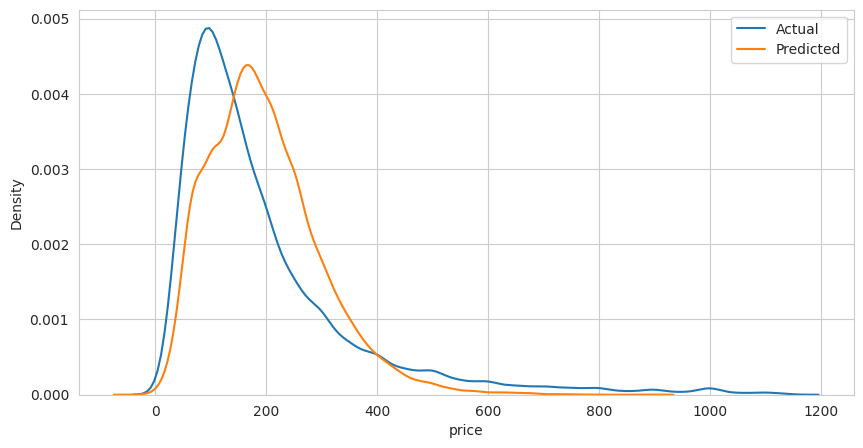

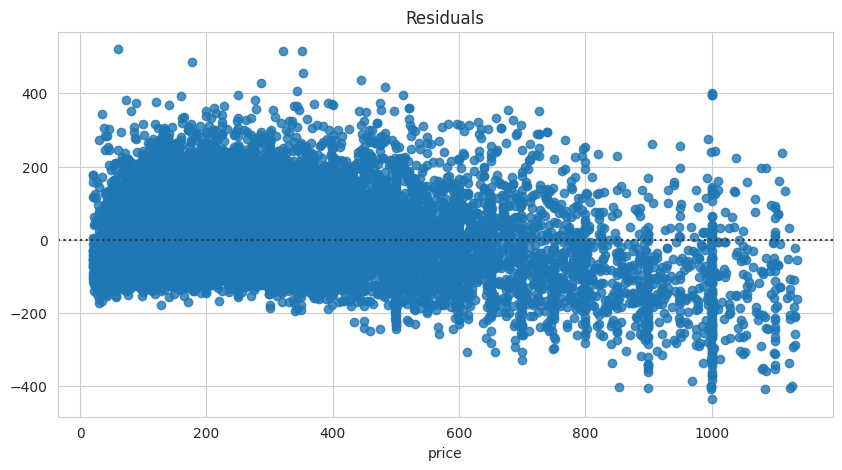

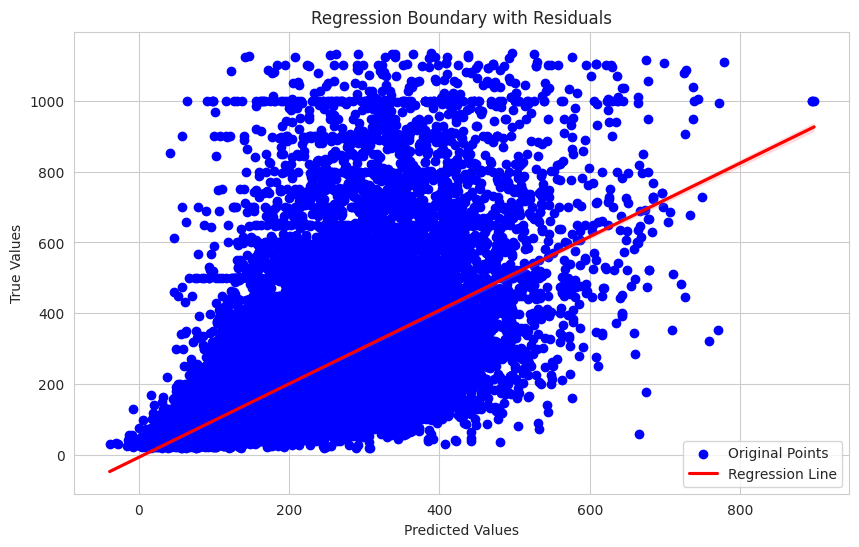

In [248]:
## without PCA
pipeline = Pipeline(
    [
        ("scaler", MinMaxScaler()),
        ("xgb", xgb.XGBRegressor())
    ]
)

pipeline.fit(X_train, y_train)

# evaluate on test data
y_pred = pipeline.predict(X_test)
print_evaluation(y_test, y_pred)
plot_actual_vs_predicted(y_test, y_pred)
plot_residuals(y_test, y_pred)
plot_regression_boundary(y_test.values, y_pred)

# Clustering

In [264]:
# select all numerical features for clustering
cluster_df = df[["latitude", "longitude", "price", "minimum_nights", "number_of_reviews" ,"calculated_host_listings_count", "availability_365"]]

In [265]:
# Scale the data
scaler = StandardScaler()
cluster_df = pd.DataFrame(scaler.fit_transform(cluster_df), columns=cluster_df.columns)
scaled_df = cluster_df

# sample scaled_df randomly
scaled_df = scaled_df.sample(frac=0.01, replace=False, random_state=SEED)

Text(0, 0.5, 'WCSS')

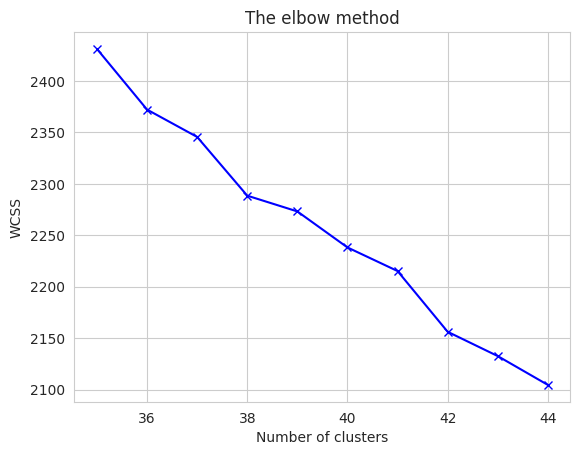

In [267]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# test kmeans using elbow method
wcss = []

for i in range(35, 45):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    kmeans.fit(scaled_df)
    wcss.append(kmeans.inertia_)

plt.plot(range(35, 45), wcss, 'bx-')
plt.title('The elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS') #within cluster sum of squares


processing: i=10
processing: i=20
processing: i=30
processing: i=40
processing: i=50
processing: i=60
processing: i=70
processing: i=80
processing: i=90


Text(0.5, 1.0, 'Silhouette analysis For Optimal k')

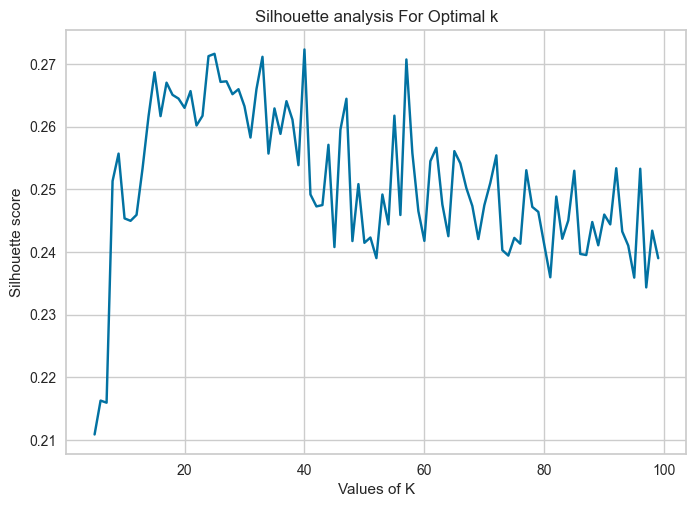

In [36]:
avg_silhouette = []

for i in range(5, 100):
    if(i % 10 == 0): 
        print(f"processing: {i=}")
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    kmeans.fit(scaled_df)
    cluster_labels = kmeans.labels_
    avg_silhouette.append(silhouette_score(scaled_df, cluster_labels))

plt.plot(range(5, 100),avg_silhouette, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Silhouette score')
plt.title('Silhouette analysis For Optimal k')

In [37]:
# get the index with the max value in avg_silhouette
max_index = avg_silhouette.index(max(avg_silhouette))
print(f"Max silhouette score: {max(avg_silhouette)}")
print(f"Optimal number of clusters: {max_index + 5}")

Max silhouette score: 0.2723466718475709
Optimal number of clusters: 40


After analysing both elbow and silhouette we found that the number of clusters was best to be 38 becuse it had an elbow and the silhouette score is very closet to max.

Silhouetter Score: 0.261


/home/ahmed/.local/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


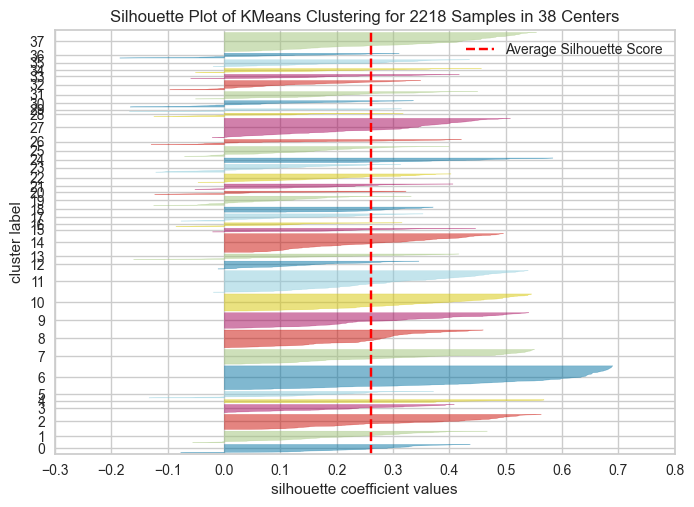

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 2218 Samples in 38 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [27]:
from yellowbrick.cluster import SilhouetteVisualizer

km = KMeans(n_clusters=38, init='k-means++', max_iter=300, n_init=10, random_state=0)
km.fit_predict(scaled_df)
clusters = km.labels_

# calculate silhouette score on a sample of 10000 rows
score = silhouette_score(scaled_df, clusters)

print('Silhouetter Score: %.3f' % score)

visualizer = SilhouetteVisualizer(km, colors='yellowbrick') #, ax=ax[q-1][mod])
visualizer.fit(scaled_df)
visualizer.show()

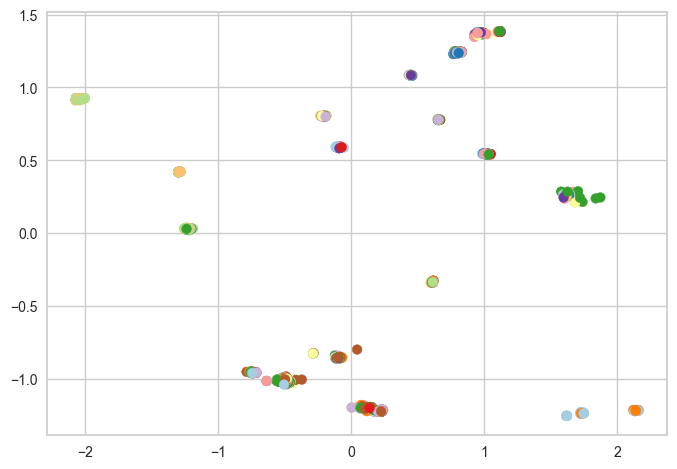

In [35]:
km = KMeans(n_clusters=38, init='k-means++', max_iter=300, n_init=10, random_state=0)
km.fit_predict(scaled_df)
plt.scatter(scaled_df["latitude"], scaled_df["longitude"], c=km.labels_, cmap='Paired')
plt.show()

#### DBSCAN

In [31]:
# Do DBSCAN on the data
from sklearn.cluster import DBSCAN

dbscan = DBSCAN(eps=0.5, min_samples=5)
dbscan.fit_predict(scaled_df)

# Calculate the silhouette score
score = silhouette_score(scaled_df, dbscan.labels_)
print('Silhouetter Score: %.3f' % score)

# printno of clusters
print(f"Number of clusters: {len(set(dbscan.labels_))}")

Silhouetter Score: -0.249
Number of clusters: 32


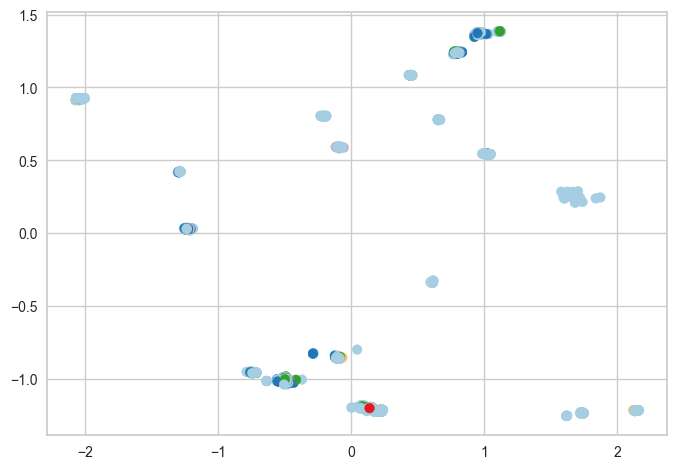

In [33]:
# change the colors
plt.scatter(scaled_df["latitude"], scaled_df["longitude"], c=dbscan.labels_, cmap='Paired')
plt.show()


### Hierarchial Clustering

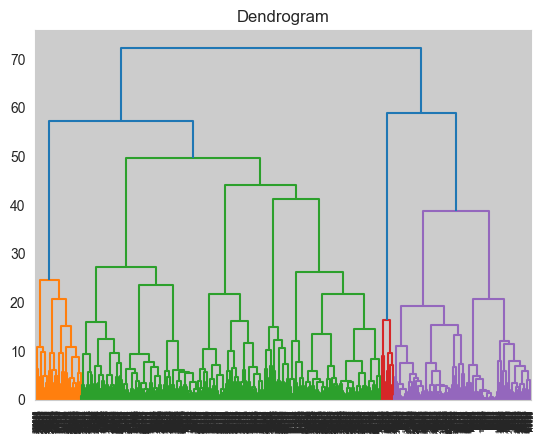

In [24]:
import scipy.cluster.hierarchy as sch

# Create the linkage matrix
linkage_matrix = sch.linkage(scaled_df, method='ward')

# Generate the dendrogram
dendrogram = sch.dendrogram(linkage_matrix, labels=scaled_df.index)
plt.title('Dendrogram')
plt.show()

processing: i=10
processing: i=20
processing: i=30
processing: i=40
processing: i=50
processing: i=60
processing: i=70
processing: i=80
processing: i=90


Text(0.5, 1.0, 'Silhouette analysis For Optimal k')

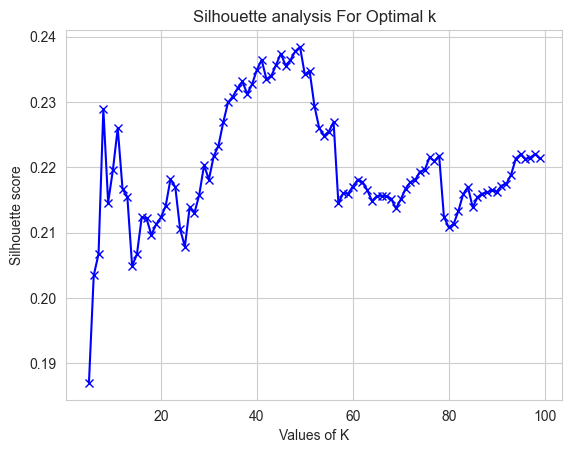

In [25]:
# Do Agglomerative Clustering
from sklearn.cluster import AgglomerativeClustering

avg_silhouette = []

for i in range(5, 100):
    if(i % 10 == 0):
        print(f"processing: {i=}")
    agg = AgglomerativeClustering(n_clusters=i)
    agg.fit(scaled_df)
    cluster_labels = agg.labels_
    avg_silhouette.append(silhouette_score(scaled_df, cluster_labels))

plt.plot(range(5, 100),avg_silhouette, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Silhouette score')
plt.title('Silhouette analysis For Optimal k')

In [26]:
# get the index with the max value in avg_silhouette
max_index = avg_silhouette.index(max(avg_silhouette))
print(f"Max silhouette score: {max(avg_silhouette)}")
print(f"Optimal number of clusters: {max_index + 5}")

Max silhouette score: 0.23841528716765986
Optimal number of clusters: 49


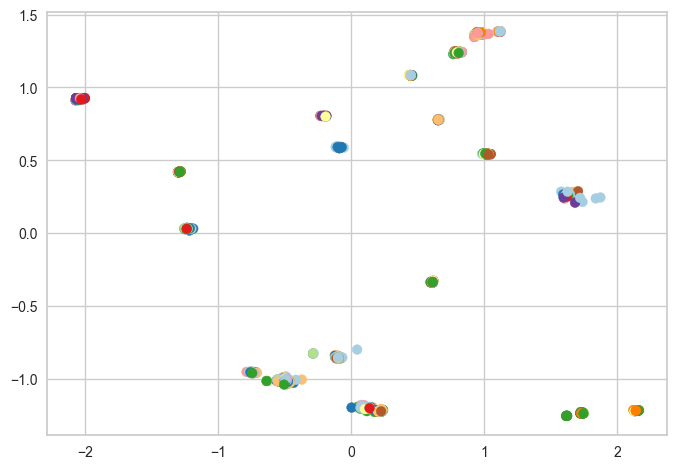

In [34]:
agg = AgglomerativeClustering(n_clusters=49)
agg.fit(scaled_df)
plt.scatter(scaled_df["latitude"], scaled_df["longitude"], c=agg.labels_, cmap='Paired')
plt.show()
